In [1]:
using ChaoticMessages
using WAV
using Plots
using DifferentialEquations
using LaTeXStrings
using Random

Consider two people: Transmitter and Receiver. Transmitter want to send a message $m(t)$ to Receiver. However, the message should not be able to be read by anyone, but the Receiver. Cuomo and Oppenheim show that one way of approaching this problem is by using synchronized chaotic system [1]. The core idea is to send the sum of the message $m(t)$ and the trajectory of the transmitter's dynamical system, use the receiver's dynamical system to reproduce the actual trajectory of the transmitter's dynamical system, and use this to directly compute $m(t)$.

In the cell below, we encoded a secret message which is audio of a taunt from Monty Python into the x-component of the trajectory of the transmitter's dynamical system which is 

\begin{align*}
\dot{x_R} &= \sigma (y_R - x_R), \\ 
\dot{y_R} &= rx_T - y_R - 20 x_T z_R, \\ 
\dot{z_R} &= 5 x_T y_R - bz_R.
\end{align*}

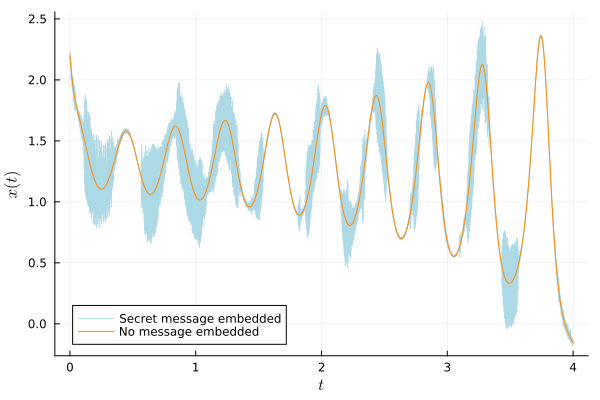

In [2]:
u0 = [2.2,1.3,2.0] # initial condition
p = [16.0, 4.0, 45.6] # parameters of the dynamical system 
tspan = (0.0,4.0) # length of the message is 4 seconds 

# Create unscaled secret message 
unencrypted_message, num_samples, sampling_rate = convert_message_to_samples("audio/taunt.wav")
unscaled_secret_message = create_secret_message(u0, p, tspan, unencrypted_message, scale = 0.4)
no_message = create_secret_message(u0, p, tspan, (t) -> 0.0)

# Plotting unscaled secret message 
time_arr = range(tspan..., length = 100000)
plot(time_arr, unscaled_secret_message, xlabel=L"t", ylabel=L"x(t)", label = "Secret message embedded", color = "lightblue")
plot!(time_arr, no_message, label = "No message embedded", color = "darkorange")

The first step is to create an encrypted message $\widetilde{m}(t) = x_T (t) + m(t)$ where the magnitude of $m(t)$ is much smaller than the magnitude of $x_T(t)$. This encrypts the message $m(t)$ because $x_T(t)$ serve as a mask to hide the message $m(t)$. Note that $m(t)$ can be made as small as we like by multiplying by $0 < \varepsilon < 1$. The receiver can multiply by $\frac{1}{\varepsilon}$ to get $m(t)$ back when the receiver recovers the scaled version of $m(t)$. The variable $\varepsilon$ is the keyword argument `scale` in `create_secret_message`. 

In [3]:
### Transmitter ###
# Create secret message 
unencrypted_message, num_samples, sampling_rate = convert_message_to_samples("audio/taunt.wav")
secret_message = create_secret_message(u0, p, tspan, unencrypted_message)

# Convert secret message to WAV file 
convert_samples_to_message(secret_message, sampling_rate, num_samples, "audio/tauntSecret.wav")

The second step is to send the encrypted message $\widetilde{m}(t)$ which is a .wav file to the receiver and the third step is to use $\widetilde{m}(t)$ to reproduce $x_T(t)$. Note that in this case, $m(t)$ is noise as the receiver's dynamical system try to synchronize with $\widetilde{m}(t)$. The receiver's dynamical system is 

\begin{align*}
\dot{x_R} &= \sigma (y_R-x_R), \\
\dot{y_R} &= r  \widetilde{m} - y_R - 20 (\widetilde{m}   z_R),\\
\dot{z_R} &= 5 \widetilde{m} y_R - b  z_R,
\end{align*}

where $x_R$ is replaced by $\widetilde{m}$ except for the equation for $\dot{x_R}$. Also, notice that the receiver's dynamical system will not perfectly recover $x_T(t)$ because of the noise $m(t)$. We compute $\widetilde{m}(t) - x_R(t) \approx x_T (t) + m(t) - x_T(t) = m(t)$ which give us the recovered message! 


In [4]:
### Receiver ###
# Get secret message 
secret_message, num_samples, sampling_rate = convert_message_to_samples("audio/tauntSecret.wav")

# Decrpyt message 
decrypted_message = decrypt_secret_message(u0, p, tspan, secret_message)

# Convert secret_message to a wav file 
convert_samples_to_message(decrypted_message, sampling_rate, num_samples, "audio/tauntDecrpyted.wav")

To examine its effectiveness, we look at the error between `unencrypted_message` and `decrypted_message` and see that the error fluctuates at around $0.1$ which is enough to listen to the message faithfully. 

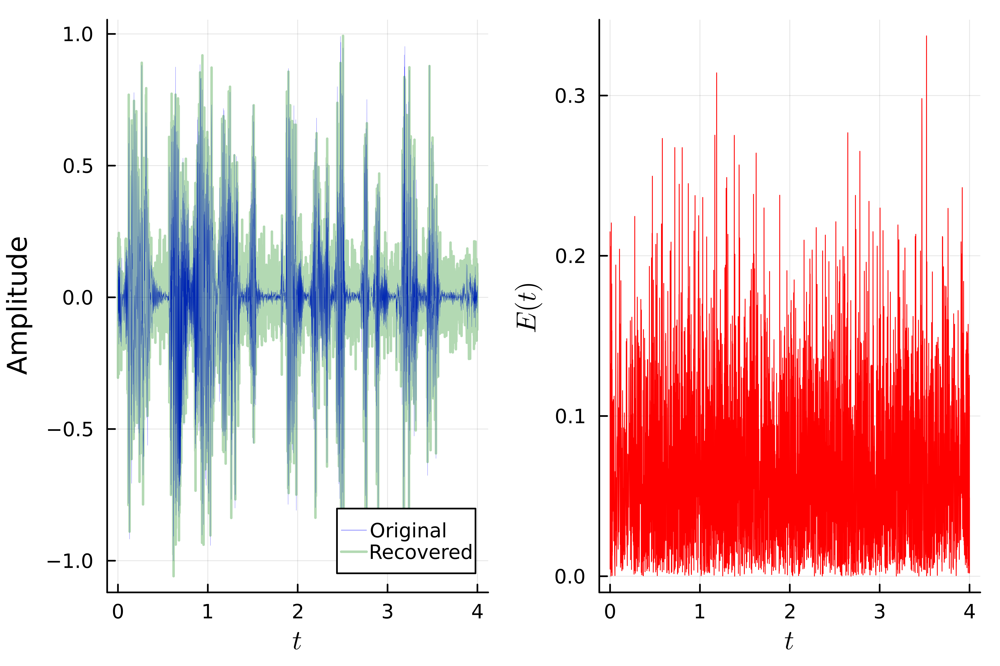

In [7]:
# Plot error between original sound file and decrypted sound file 
abs_error = error_set_up(unencrypted_message, decrypted_message)
error_plot = plot(abs_error, tspan..., legend = false, xlabel=L"t", ylabel=L"E(t)", color = "red", linewidth=0.5)

# Plot unencrypted message and encrypted message 
sound_plot = plot(unencrypted_message,tspan...,label="Original", xlabel=L"t", ylabel="Amplitude", color = "blue", linewidth=0.1)
plot!(sound_plot, decrypted_message,tspan...,label="Recovered", linewidth=1.5, linealpha=0.3, color = "green")
combined_plot = plot(sound_plot, error_plot, dpi = 900)

display(combined_plot)

Noise can be added to the message to test whether this form of encryption is robust to noise or not. We tested it for $\sigma = 0.1, 0.5, 1.0, 2.0$. The message is still recovered, but is masked with static noise. For a large $\sigma$, the message cannot be heard because of the static noise. Hence, this is not robust to noise. 

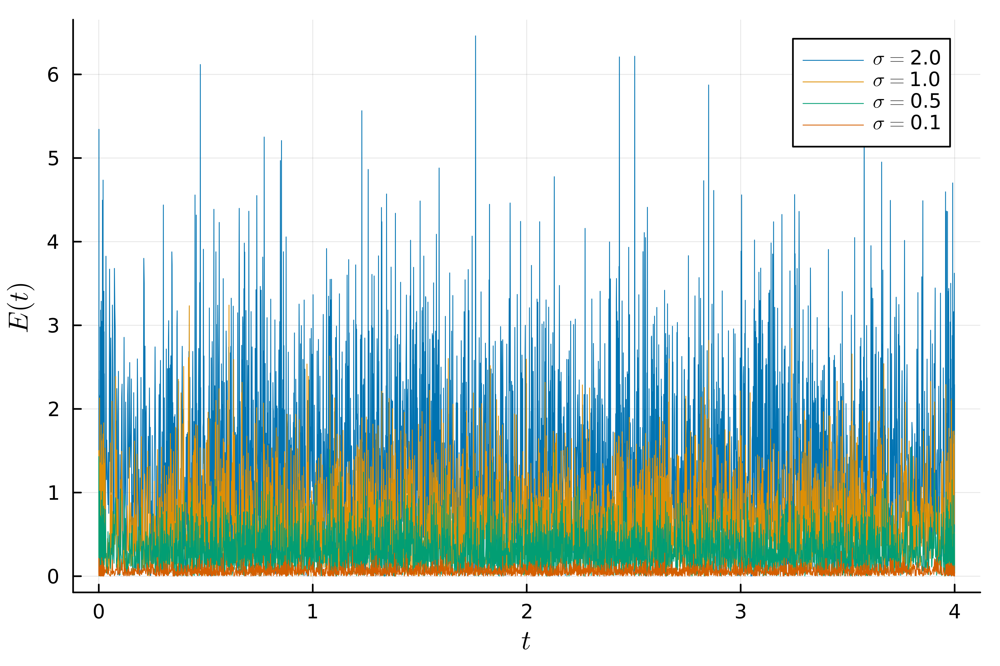

In [6]:
Random.seed!(42424242) # set seed 

message_unencrypted, _, _ = convert_message_to_samples("audio/taunt.wav")

error_plot = plot()
# plot error for various levels of standard deviation 
for s in [2.0, 1.0, 0.5, 0.1] 
    # Create secret message 
    message_unencrypted_noisy, num_samples, sampling_rate = convert_message_to_samples("audio/taunt.wav", add_noise = true, std = s)
    secret_message = create_secret_message(u0, p, tspan, message_unencrypted_noisy)

    # Convert secret message to WAV file 
    convert_samples_to_message(secret_message, sampling_rate, num_samples, "audio/tauntSecret.wav")

    ### Receiver ###
    # Get secret message 
    secret_message, num_samples, sampling_rate = convert_message_to_samples("audio/tauntSecret.wav")

    # Decrpyt message 
    decrypted_message = decrypt_secret_message(u0, p, tspan, secret_message)

    # Convert secret_message to a wav file 
    convert_samples_to_message(decrypted_message, sampling_rate, num_samples, "audio/tauntDecrpyted-" * string(s) * ".wav")

    # Plot the error 
    abs_error = error_set_up(message_unencrypted, decrypted_message)
    
    plot!(abs_error, tspan..., xlabel=L"t", ylabel=L"E(t)", labels = L"\sigma = " * string(s), palette = :seaborn_colorblind, linewidth = 0.5, dpi = 600)
  end 

display(error_plot)

[1] Kevin M. Cuomo and Alan V. Oppenheim. “Circuit implementation of synchronized chaos with applications to communications”. In: Phys. Rev. Lett. 71 (1 July 1993), pp. 65–68. doi:10.1103/PhysRevLett.71.65. url: https://link.aps.org/doi/10.1103/PhysRevLett.71.65